In [1]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt; plt.style.use('ggplot')
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
import time
import random
from itertools import combinations
from tqdm.notebook import tqdm
import optuna
import math

from sklearn.preprocessing import OneHotEncoder, LabelEncoder, RobustScaler
from sklearn.compose import make_column_transformer
from sklearn.metrics import make_scorer, log_loss
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.feature_selection import RFECV, mutual_info_classif

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from concurrent.futures import ThreadPoolExecutor

from lightgbm import LGBMClassifier

from pprint import pprint
import os

pd.set_option('display.max_columns', None)

experiment_name = 'lgbm'

In [2]:
train = pd.read_csv(r'.\train.csv')
test = pd.read_csv(r'.\test.csv')

original = pd.read_csv(r'.\cirrhosis.csv')
original.dropna(inplace=True)
train.head(3)

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D
1,1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C
2,2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D


In [3]:
train = pd.concat([train, original], axis=0)
train.shape

(8181, 21)

In [4]:
# Columns with missing values
train.columns[train.isna().any()]

Index(['id', 'ID'], dtype='object')

In [5]:
TARGET = 'Status'
binary_cols = ['Ascites', 'Hepatomegaly', 'Spiders']
categorical_cols = ['Drug', 'Sex', 'Stage', 'Edema']
drop_cols = ['id', TARGET, 'ID']

In [6]:
numerical_cols = train.drop(categorical_cols + binary_cols + drop_cols, axis=1).select_dtypes(include=np.number).columns
numerical_cols

Index(['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin'],
      dtype='object')

In [7]:
yes_no_mapping = {'Y': 1, 'N': 0}

for col in binary_cols:
    train[col] = train[col].map(yes_no_mapping)
    test[col] = test[col].map(yes_no_mapping)

## Feature Engineering

In [8]:
epsilon = 1e-10

def feat_engineering(df, numerical_features, binary_cols):
    df_new = df.copy()

    # Transformation of numerical features
    for feature in numerical_features:
        # Log transformation (add small value to avoid log(0))
        df_new[f"{feature}_log"] = np.log(df[feature] + 1e-10)

        # Square root transformation
        df_new[f"{feature}_sqrt"] = np.sqrt(df[feature])

        # Polynomial transformations
        df_new[f"{feature}_degree2"] = df[feature]**2
        df_new[f"{feature}_degree3"] = df[feature]**3

    # Pairwise numerical feature operations
    for i in range(len(numerical_features)):
        for j in range(i, len(numerical_features)):
            if i != j:
                feat1 = numerical_features[i]
                feat2 = numerical_features[j]

                # Multiplication
                df_new[f"{feat1}_x_{feat2}"] = df[feat1] * df[feat2]

                # Addition
                df_new[f"{feat1}_plus_{feat2}"] = df[feat1] + df[feat2]

                # Subtraction (both ways)
                df_new[f"{feat1}_minus_{feat2}"] = df[feat1] - df[feat2]
                df_new[f"{feat2}_minus_{feat1}"] = df[feat2] - df[feat1]

                # Ratio (both ways)
                df_new[f"{feat1}_div_{feat2}"] = df[feat1] / (df[feat2] + epsilon)
                df_new[f"{feat2}_div_{feat1}"] = df[feat2] / (df[feat1] + epsilon)

                # Mean
                df_new[f"Mean_{feat1}_{feat2}"] = df[[feat1, feat2]].mean(axis=1)

                # Standard Deviation
                df_new[f"Std_{feat1}_{feat2}"] = df[[feat1, feat2]].std(axis=1)

                # Percentage Sum (both ways)
                df_new[f"percent_sum_{feat1}_{feat2}"] = (df[feat1] / (df[feat1] + df[feat2] + epsilon)) * 100
                df_new[f"percent_sum_{feat2}_{feat1}"] = (df[feat2] / (df[feat1] + df[feat2] + epsilon)) * 100
                
                # Compare value of features
                df_new[f"{feat1}_gt_{feat2}"] = (df[feat1] > df[feat2]).astype(int)

    # Additional feature engineering for 3 numerical features
    for i in range(len(numerical_features)):
        for j in range(i+1, len(numerical_features)):
            for k in range(j+1, len(numerical_features)):
                feat1, feat2, feat3 = numerical_features[i], numerical_features[j], numerical_features[k]

                # Addition of two features and then subtraction a third
                df_new[f"{feat1}_plus_{feat2}_minus_{feat3}"] = df[feat1] + df[feat2] - df[feat3]
                df_new[f"{feat1}_plus_{feat3}_minus_{feat2}"] = df[feat1] + df[feat3] - df[feat2]
                df_new[f"{feat2}_plus_{feat3}_minus_{feat1}"] = df[feat2] + df[feat3] - df[feat1]

                # Addition of all three features
                df_new[f"{feat1}_plus_{feat2}_plus_{feat3}"] = df[feat1] + df[feat2] + df[feat3]

                # Addition of two features to then be subtracted from the third
                df_new[f"{feat1}_plus_{feat2}_sub_by_{feat3}"] = df[feat3] - (df[feat1] + df[feat2])
                df_new[f"{feat1}_plus_{feat3}_sub_by_{feat2}"] = df[feat2] - (df[feat1] + df[feat3])
                df_new[f"{feat2}_plus_{feat3}_sub_by_{feat1}"] = df[feat1] - (df[feat2] + df[feat3])

                # Multiplication of all three features
                df_new[f"{feat1}_x_{feat2}_x_{feat3}"] = df[feat1] * df[feat2] * df[feat3]

                # One feature divided by the sum of the other two features (three combinations)
                df_new[f"{feat1}_div_sum_of_{feat2}_and_{feat3}"] = df[feat1] / (df[feat2] + df[feat3] + epsilon)
                df_new[f"{feat2}_div_sum_of_{feat1}_and_{feat3}"] = df[feat2] / (df[feat1] + df[feat3] + epsilon)
                df_new[f"{feat3}_div_sum_of_{feat1}_and_{feat2}"] = df[feat3] / (df[feat1] + df[feat2] + epsilon)

                # One feature divided by the multiplication of the other two features (three combinations)
                df_new[f"{feat1}_div_prod_of_{feat2}_and_{feat3}"] = df[feat1] / (df[feat2] * df[feat3] + epsilon)
                df_new[f"{feat2}_div_prod_of_{feat1}_and_{feat3}"] = df[feat2] / (df[feat1] * df[feat3] + epsilon)
                df_new[f"{feat3}_div_prod_of_{feat1}_and_{feat2}"] = df[feat3] / (df[feat1] * df[feat2] + epsilon)

                # The mean of all three features
                df_new[f"Mean_of_{feat1}_{feat2}_{feat3}"] = df[[feat1, feat2, feat3]].mean(axis=1)

                # The standard deviation of all three features
                df_new[f"Std_of_{feat1}_{feat2}_{feat3}"] = df[[feat1, feat2, feat3]].std(axis=1)

    for col1, col2 in combinations(binary_cols, 2):
        df_new[f'{col1}_and_{col2}'] = df_new[col1] & df_new[col2]
        df_new[f'{col1}_or_{col2}'] = df_new[col1] | df_new[col2]
        df_new[f'{col1}_nor_{col2}'] = ~(df_new[col1] | df_new[col2])
        df_new[f'{col1}_xor_{col2}'] = df_new[col1] ^ df_new[col2]

    for col1, col2, col3 in combinations(binary_cols, 3):
        df_new[f'{col1}_and_{col2}_and_{col3}'] = df_new[col1] & df_new[col2] & df_new[col3]
        df_new[f'{col1}_or_{col2}_or_{col3}'] = df_new[col1] | df_new[col2] | df_new[col3]
        df_new[f'{col1}_nor_{col2}_nor_{col3}'] = ~(df_new[col1] | df_new[col2] | df_new[col3])
        df_new[f'{col1}_xor_{col2}_xor_{col3}'] = df_new[col1] ^ df_new[col2] ^ df_new[col3]

    # Domain Knowledge
    # Bilirubin
    df_new['Bilirubin_Risk_Level'] = pd.cut(df['Bilirubin'], bins=[0, 1.2, 2, np.inf], labels=['Normal', 'Elevated', 'Jaundice'], right=False)

    # Total Serum Cholesterol
    df_new['Cholesterol_Risk_Level'] = pd.cut(df['Cholesterol'], bins=[0, 200, 240, np.inf], labels=['Normal', 'Borderline', 'High'], right=False)

    # Albumin
    df_new['Albumin_Risk_Level'] = pd.cut(df['Albumin'], bins=[0, 3.4, 5.4, np.inf], labels=['Low', 'Normal', 'High'], right=False)

    # Copper
    df_new['Copper_Normal'] = ((df['Copper'] >= 62) & (df['Copper'] <= 140)).astype(int)
    df_new['Copper_High'] = (df['Copper'] > 140).astype(int)

    # Alkaline Phosphatase (Alk_Phos)
    df_new['Alk_Phos_Normal'] = ((df['Alk_Phos'] >= 44) & (df['Alk_Phos'] <= 147)).astype(int)
    df_new['Alk_Phos_High'] = (df['Alk_Phos'] > 147).astype(int)

    # SGOT
    df_new['SGOT_Normal'] = ((df['SGOT'] >= 8) & (df['SGOT'] <= 45)).astype(int)

    # Tryglicerides
    df_new['Tryglicerides_Normal'] = (df['Tryglicerides'] < 150).astype(int)
    df_new['Tryglicerides_Borderline'] = ((df['Tryglicerides'] >= 150) & (df['Tryglicerides'] < 200)).astype(int)
    df_new['Tryglicerides_High'] = ((df['Tryglicerides'] >= 200) & (df['Tryglicerides'] < 500)).astype(int)
    df_new['Tryglicerides_Very_High'] = (df['Tryglicerides'] >= 500).astype(int)

    # Platelets
    df_new['Platelets_Normal'] = ((df['Platelets'] >= 150000) & (df['Platelets'] <= 450000)).astype(int)
    df_new['Platelets_Low'] = (df['Platelets'] < 150000).astype(int)

    # Prothrombin
    df_new['Prothrombin_Normal'] = ((df['Prothrombin'] >= 11) & (df['Prothrombin'] <= 13.5)).astype(int)

    # Age Group
    df_new['Age_Group'] = pd.cut(df['Age'], bins=[0, 18 * 365.25, 60 * 365.25, np.inf], labels=['Pediatric', 'Adult', 'Senior'])

    return df_new

In [9]:
train = feat_engineering(train, numerical_cols, binary_cols)
test = feat_engineering(test, numerical_cols, binary_cols)
train.shape, test.shape

((8181, 3342), (5271, 3340))

In [10]:
feateng_binary_cols = []
feateng_categorical_cols = []


# Loop through every column columns to separate binary and categorical
for col in train.drop(drop_cols, axis=1).columns:
    unique_values = train[col].nunique(dropna=False)
    if unique_values == 2:
        feateng_binary_cols.append(col)
    elif unique_values > 2 and unique_values < 10:
        feateng_categorical_cols.append(col)

feateng_numerical_cols = list(train.drop(feateng_categorical_cols + feateng_binary_cols + drop_cols, axis=1).select_dtypes(include=np.number).columns)
len(feateng_numerical_cols), len(feateng_binary_cols), len(feateng_categorical_cols)

(3279, 56, 4)

## Preprocess Data

In [11]:
transformer = make_column_transformer(
    (OneHotEncoder(sparse=False, handle_unknown='infrequent_if_exist', drop='if_binary'), feateng_binary_cols),
    (OneHotEncoder(sparse=False, handle_unknown='infrequent_if_exist'), feateng_categorical_cols),
    (RobustScaler(), numerical_cols),
    remainder='passthrough')

df_to_ohe = train.drop(drop_cols, axis=1)
test_ohe = test.drop('id', axis=1)

transformed = transformer.fit_transform(df_to_ohe)

# Get the transformed feature names
transformed_feat_names = [name.split('__')[-1] for name in transformer.get_feature_names_out()]

# Create DataFrame of the transformed features
df_to_ohe_transformed = pd.DataFrame(transformed, columns=transformed_feat_names)
df_to_ohe_transformed.sample()

Drug_Placebo  Sex_M  Ascites_1  Hepatomegaly_1  Spiders_1  \
726           1.0    0.0        0.0             1.0        1.0   

     N_Days_gt_Cholesterol_1  N_Days_gt_Copper_1  N_Days_gt_Alk_Phos_1  \
726                      1.0                 1.0                   1.0   

     N_Days_gt_SGOT_1  N_Days_gt_Tryglicerides_1  N_Days_gt_Platelets_1  \
726               1.0                        1.0                    1.0   

     Age_gt_Alk_Phos_1  Bilirubin_gt_Albumin_1  Bilirubin_gt_Copper_1  \
726                1.0                     1.0                    0.0   

     Bilirubin_gt_Prothrombin_1  Cholesterol_gt_Copper_1  \
726                         1.0                      1.0   

     Cholesterol_gt_Alk_Phos_1  Cholesterol_gt_SGOT_1  \
726                        0.0                    1.0   

     Cholesterol_gt_Tryglicerides_1  Cholesterol_gt_Platelets_1  \
726                             1.0                         1.0   

     Copper_gt_Alk_Phos_1  Copper_gt_SGOT_1  Copper_gt_Tryglicerides_1  \
726                   0.0               0.0                        1.0   

     Copper_gt_Platelets_1  Copper_gt_Prothrombin_1  \
726                    0.0                      1.0   

     Alk_Phos_gt_Tryglicerides_1  Alk_Phos_gt_Platelets_1  \
726                          1.0                      1.0   

     SGOT_gt_Tryglicerides_1  SGOT_gt_Platelets_1  \
726                      1.0                  0.0   

     Tryglicerides_gt_Platelets_1  Ascites_and_Hepatomegaly_1  \
726                           0.0                         0.0   

     Ascites_or_Hepatomegaly_1  Ascites_nor_Hepatomegaly_-1  \
726                        1.0                          0.0   

     Ascites_xor_Hepatomegaly_1  Ascites_and_Spiders_1  Ascites_or_Spiders_1  \
726                         1.0                    0.0                   1.0   

     Ascites_nor_Spiders_-1  Ascites_xor_Spiders_1  \
726                     0.0                    1.0   

     Hepatomegaly_and_Spiders_1  Hepatomegaly_or_Spiders_1  \
726                         1.0                        1.0   

     Hepatomegaly_nor_Spiders_-1  Hepatomegaly_xor_Spiders_1  \
726                          0.0                         0.0   

     Ascites_and_Hepatomegaly_and_Spiders_1  \
726                                     0.0   

     Ascites_or_Hepatomegaly_or_Spiders_1  \
726                                   1.0   

     Ascites_nor_Hepatomegaly_nor_Spiders_-1  \
726                                      0.0   

     Ascites_xor_Hepatomegaly_xor_Spiders_1  Albumin_Risk_Level_Normal  \
726                                     0.0                        1.0   

     Copper_Normal_1  Copper_High_1  SGOT_Normal_1  Tryglicerides_Normal_1  \
726              0.0            1.0            0.0                     1.0   

     Tryglicerides_Borderline_1  Tryglicerides_High_1  \
726                         0.0                   0.0   

     Tryglicerides_Very_High_1  Prothrombin_Normal_1  Age_Group_Senior  \
726                        0.0                   0.0               0.0   

     Edema_N  Edema_S  Edema_Y  Stage_1.0  Stage_2.0  Stage_3.0  Stage_4.0  \
726      1.0      0.0      0.0        0.0        0.0        0.0        1.0   

     Bilirubin_Risk_Level_Elevated  Bilirubin_Risk_Level_Jaundice  \
726                            0.0                            1.0   

     Bilirubin_Risk_Level_Normal  Cholesterol_Risk_Level_Borderline  \
726                          0.0                                0.0   

     Cholesterol_Risk_Level_High  Cholesterol_Risk_Level_Normal    N_Days  \
726                          1.0                            0.0 -0.366004   

          Age  Bilirubin  Cholesterol   Albumin    Copper  Alk_Phos   SGOT  \
726  0.299804   5.826087     1.798611 -0.047619  1.269841  0.074291  0.575   

     Tryglicerides  Platelets  Prothrombin  N_Days_log  N_Days_sqrt  \
726            0.4  -0.009434         -0.4    7.167809    36.013886   

     N_Days_degree2  N_Days_degree3

In [12]:
transformed_new_data = transformer.transform(test_ohe)

# Create DataFrame of the transformed features
test_transformed = pd.DataFrame(transformed_new_data, columns=transformed_feat_names)
test_transformed.sample()

Drug_Placebo  Sex_M  Ascites_1  Hepatomegaly_1  Spiders_1  \
4157           1.0    0.0        0.0             1.0        1.0   

      N_Days_gt_Cholesterol_1  N_Days_gt_Copper_1  N_Days_gt_Alk_Phos_1  \
4157                      1.0                 1.0                   0.0   

      N_Days_gt_SGOT_1  N_Days_gt_Tryglicerides_1  N_Days_gt_Platelets_1  \
4157               1.0                        1.0                    1.0   

      Age_gt_Alk_Phos_1  Bilirubin_gt_Albumin_1  Bilirubin_gt_Copper_1  \
4157                1.0                     1.0                    0.0   

      Bilirubin_gt_Prothrombin_1  Cholesterol_gt_Copper_1  \
4157                         0.0                      1.0   

      Cholesterol_gt_Alk_Phos_1  Cholesterol_gt_SGOT_1  \
4157                        0.0                    1.0   

      Cholesterol_gt_Tryglicerides_1  Cholesterol_gt_Platelets_1  \
4157                             1.0                         1.0   

      Copper_gt_Alk_Phos_1  Copper_gt_SGOT_1  Copper_gt_Tryglicerides_1  \
4157                   0.0               1.0                        1.0   

      Copper_gt_Platelets_1  Copper_gt_Prothrombin_1  \
4157                    1.0                      1.0   

      Alk_Phos_gt_Tryglicerides_1  Alk_Phos_gt_Platelets_1  \
4157                          1.0                      1.0   

      SGOT_gt_Tryglicerides_1  SGOT_gt_Platelets_1  \
4157                      0.0                  0.0   

      Tryglicerides_gt_Platelets_1  Ascites_and_Hepatomegaly_1  \
4157                           0.0                         0.0   

      Ascites_or_Hepatomegaly_1  Ascites_nor_Hepatomegaly_-1  \
4157                        1.0                          0.0   

      Ascites_xor_Hepatomegaly_1  Ascites_and_Spiders_1  Ascites_or_Spiders_1  \
4157                         1.0                    0.0                   1.0   

      Ascites_nor_Spiders_-1  Ascites_xor_Spiders_1  \
4157                     0.0                    1.0   

      Hepatomegaly_and_Spiders_1  Hepatomegaly_or_Spiders_1  \
4157                         1.0                        1.0   

      Hepatomegaly_nor_Spiders_-1  Hepatomegaly_xor_Spiders_1  \
4157                          0.0                         0.0   

      Ascites_and_Hepatomegaly_and_Spiders_1  \
4157                                     0.0   

      Ascites_or_Hepatomegaly_or_Spiders_1  \
4157                                   1.0   

      Ascites_nor_Hepatomegaly_nor_Spiders_-1  \
4157                                      0.0   

      Ascites_xor_Hepatomegaly_xor_Spiders_1  Albumin_Risk_Level_Normal  \
4157                                     0.0                        0.0   

      Copper_Normal_1  Copper_High_1  SGOT_Normal_1  Tryglicerides_Normal_1  \
4157              0.0            1.0            0.0                     1.0   

      Tryglicerides_Borderline_1  Tryglicerides_High_1  \
4157                         0.0                   0.0   

      Tryglicerides_Very_High_1  Prothrombin_Normal_1  Age_Group_Senior  \
4157                        0.0                   1.0               0.0   

      Edema_N  Edema_S  Edema_Y  Stage_1.0  Stage_2.0  Stage_3.0  Stage_4.0  \
4157      1.0      0.0      0.0        0.0        0.0        0.0        1.0   

      Bilirubin_Risk_Level_Elevated  Bilirubin_Risk_Level_Jaundice  \
4157                            0.0                            1.0   

      Bilirubin_Risk_Level_Normal  Cholesterol_Risk_Level_Borderline  \
4157                          0.0                                0.0   

      Cholesterol_Risk_Level_High  Cholesterol_Risk_Level_Normal   N_Days  \
4157                          1.0                            0.0 -0.72584   

           Age  Bilirubin  Cholesterol   Albumin    Copper  Alk_Phos   SGOT  \
4157  0.371624        1.0     2.451389 -0.761905  2.857143   -0.1261 -0.025   

      Tryglicerides  Platelets  Prothrombin  N_Days_log  N_Days_sqrt  \
4157       0.818182  -0.820755          0.8    6.64

In [13]:
# Convert object type columns back to numeric if they were originally numeric
for col in df_to_ohe_transformed.columns:
    if df_to_ohe_transformed[col].dtype == 'object':
        df_to_ohe_transformed[col] = pd.to_numeric(df_to_ohe_transformed[col], errors='coerce')

In [14]:
encoded_binary_cols = []
encoded_categorical_cols = []

# Loop through every column columns to separate binary and categorical
for col in df_to_ohe_transformed.columns:
    unique_values = df_to_ohe_transformed[col].nunique(dropna=False)
    print(f'{col} has {unique_values} unique values')
    if unique_values == 2:
        encoded_binary_cols.append(col)
    elif unique_values > 2 and unique_values < 10:
        encoded_categorical_cols.append(col)

encoded_numerical_cols = list(df_to_ohe_transformed.drop(encoded_binary_cols, axis=1).select_dtypes(include=np.number).columns)
len(encoded_numerical_cols), len(encoded_binary_cols), len(encoded_categorical_cols)

Drug_Placebo has 2 unique values
Sex_M has 2 unique values
Ascites_1 has 2 unique values
Hepatomegaly_1 has 2 unique values
Spiders_1 has 2 unique values
N_Days_gt_Cholesterol_1 has 2 unique values
N_Days_gt_Copper_1 has 2 unique values
N_Days_gt_Alk_Phos_1 has 2 unique values
N_Days_gt_SGOT_1 has 2 unique values
N_Days_gt_Tryglicerides_1 has 2 unique values
N_Days_gt_Platelets_1 has 2 unique values
Age_gt_Alk_Phos_1 has 2 unique values
Bilirubin_gt_Albumin_1 has 2 unique values
Bilirubin_gt_Copper_1 has 2 unique values
Bilirubin_gt_Prothrombin_1 has 2 unique values
Cholesterol_gt_Copper_1 has 2 unique values
Cholesterol_gt_Alk_Phos_1 has 2 unique values
Cholesterol_gt_SGOT_1 has 2 unique values
Cholesterol_gt_Tryglicerides_1 has 2 unique values
Cholesterol_gt_Platelets_1 has 2 unique values
Copper_gt_Alk_Phos_1 has 2 unique values
Copper_gt_SGOT_1 has 2 unique values
Copper_gt_Tryglicerides_1 has 2 unique values
Copper_gt_Platelets_1 has 2 unique values
Copper_gt_Prothrombin_1 has 2 u

(3279, 69, 0)

In [15]:
label_encoder = LabelEncoder()

label_encoder.fit(train[TARGET])

df_to_ohe_transformed[TARGET] = label_encoder.transform(train[TARGET])

df_to_ohe_transformed.head()

Drug_Placebo  Sex_M  Ascites_1  Hepatomegaly_1  Spiders_1  \
0           0.0    1.0        0.0             0.0        0.0   
1           1.0    0.0        0.0             0.0        0.0   
2           1.0    0.0        0.0             1.0        1.0   
3           1.0    0.0        0.0             0.0        0.0   
4           1.0    0.0        0.0             1.0        0.0   

   N_Days_gt_Cholesterol_1  N_Days_gt_Copper_1  N_Days_gt_Alk_Phos_1  \
0                      1.0                 1.0                   0.0   
1                      1.0                 1.0                   1.0   
2                      1.0                 1.0                   1.0   
3                      1.0                 1.0                   1.0   
4                      1.0                 1.0                   0.0   

   N_Days_gt_SGOT_1  N_Days_gt_Tryglicerides_1  N_Days_gt_Platelets_1  \
0               1.0                        1.0                    1.0   
1               1.0                        1.0                    1.0   
2               1.0                        1.0                    1.0   
3               1.0                        1.0                    1.0   
4               1.0                        1.0                    1.0   

   Age_gt_Alk_Phos_1  Bilirubin_gt_Albumin_1  Bilirubin_gt_Copper_1  \
0                1.0                     0.0                    0.0   
1                1.0                     0.0                    0.0   
2                1.0                     0.0                    0.0   
3                1.0                     0.0                    0.0   
4                1.0                     0.0                    0.0   

   Bilirubin_gt_Prothrombin_1  Cholesterol_gt_Copper_1  \
0                         0.0                      1.0   
1                         0.0                      1.0   
2                         0.0                      1.0   
3                         0.0                      1.0   
4                         0.0                      1.0   

   Cholesterol_gt_Alk_Phos_1  Cholesterol_gt_SGOT_1  \
0                        0.0                    1.0   
1                        0.0                    1.0   
2                        0.0                    1.0   
3                        0.0                    1.0   
4                        0.0                    1.0   

   Cholesterol_gt_Tryglicerides_1  Cholesterol_gt_Platelets_1  \
0                             1.0                         0.0   
1                             1.0                         1.0   
2                             1.0                         1.0   
3                             1.0                         0.0   
4                             1.0                         1.0   

   Copper_gt_Alk_Phos_1  Copper_gt_SGOT_1  Copper_gt_Tryglicerides_1  \
0                   0.0               0.0                        1.0   
1                   0.0               0.0                        0.0   
2                   0.0               1.0                        1.0   
3                   0.0               0.0                        0.0   
4                   0.0               0.0                        0.0   

   Copper_gt_Platelets_1  Copper_gt_Prothrombin_1  \
0                    0.0                      1.0   
1                    0.0                      1.0   
2                    0.0                      1.0   
3                    0.0                      1.0   
4                    0.0                      1.0   

   Alk_Phos_gt_Tryglicerides_1  Alk_Phos_gt_Platelets_1  \
0                          1.0                      1.0   
1                          1.0                      1.0   
2                          1.0                      1.0   
3                          1.0                      1.0   
4                          1.0                      1.0   

   SGOT_gt_Tryglicerides_1  SGOT_gt_Platelets_1  Tryglicerides_gt_Platelets_1  \
0                      1.0                  0.0             

### Feature Selection

### Remove highly correlated features
- Spearman Correlation

Dealing with continuous variables that are not normally distributed (and hence RobustScaler) and binary variables, Spearman's rank correlation coefficient might be the most appropriate. It does not assume a linear relationship or normality, making it suitable for a mixture of continuous (scaled) and binary variables.

In [16]:
# # Remove correlated features (leaving just 1 of each pair)
# # Leave features highly correlated with the target
# df = df_to_ohe_transformed.drop(TARGET, axis=1)
# correlation_matrix_spear = df.corr(method='spearman').abs()

# # Select upper triangle of correlation matrix
# upper_spear = correlation_matrix_spear.where(np.triu(np.ones(correlation_matrix_spear.shape), k=1).astype(bool))

# # Find index of feature columns with correlation greater than a threshold (e.g., 0.9 in this case)
# to_drop_spear = [column for column in upper_spear.columns if any(upper_spear[column] >= 0.9)]

# # Drop features
# df_reduced_spear = df_to_ohe_transformed.drop(to_drop_spear, axis=1)

# # Get list of low correlation features excluding TARGET
# low_corr_feats_spear = list(df_reduced_spear.drop(TARGET, axis=1).columns)

# # Print the high correlation features effect
# # Both pre and post drop dfs contain the TARGET
# print(f"Dropped {len(to_drop_spear)} highly correlated features.\nOld Shape of the dataset was {df_to_ohe_transformed.shape}\nNew shape of the dataset is {df_reduced_spear.shape}")

In [17]:
# # Temporarily adjust the display.max_rows setting to display all rows
# # Get the feature names to a text file
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     feats = str(low_corr_feats_spear)
#     with open('low_corr_feats_lgbm.txt', 'w') as f:
#         f.write(feats)

In [18]:
low_corr_feats = ['Drug_Placebo', 'Sex_M', 'Ascites_1', 'Hepatomegaly_1', 'Spiders_1', 'N_Days_gt_Cholesterol_1', 'N_Days_gt_Copper_1', 'N_Days_gt_Alk_Phos_1', 'N_Days_gt_SGOT_1', 'N_Days_gt_Tryglicerides_1', 'N_Days_gt_Platelets_1', 'Age_gt_Alk_Phos_1', 'Bilirubin_gt_Albumin_1', 'Bilirubin_gt_Copper_1', 'Bilirubin_gt_Prothrombin_1', 'Cholesterol_gt_Copper_1', 'Cholesterol_gt_Alk_Phos_1', 'Cholesterol_gt_SGOT_1', 'Cholesterol_gt_Tryglicerides_1', 'Cholesterol_gt_Platelets_1', 'Copper_gt_Alk_Phos_1', 'Copper_gt_SGOT_1', 'Copper_gt_Tryglicerides_1', 'Copper_gt_Platelets_1', 'Copper_gt_Prothrombin_1', 'Alk_Phos_gt_Platelets_1', 'SGOT_gt_Tryglicerides_1', 'SGOT_gt_Platelets_1', 'Tryglicerides_gt_Platelets_1', 'Ascites_and_Spiders_1', 'Hepatomegaly_and_Spiders_1', 'Hepatomegaly_xor_Spiders_1', 'Ascites_xor_Hepatomegaly_xor_Spiders_1', 'Albumin_Risk_Level_Normal', 'Copper_Normal_1', 'Copper_High_1', 'SGOT_Normal_1', 'Tryglicerides_Normal_1', 'Tryglicerides_Borderline_1', 'Tryglicerides_High_1', 'Tryglicerides_Very_High_1', 'Prothrombin_Normal_1', 'Age_Group_Senior', 'Edema_N', 'Edema_S', 'Edema_Y', 'Stage_1.0', 'Stage_2.0', 'Stage_3.0', 'Stage_4.0', 'Bilirubin_Risk_Level_Elevated', 'Bilirubin_Risk_Level_Jaundice', 'Bilirubin_Risk_Level_Normal', 'Cholesterol_Risk_Level_Borderline', 'Cholesterol_Risk_Level_High', 'Cholesterol_Risk_Level_Normal', 'N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'N_Days_gt_Age', 'N_Days_x_Bilirubin', 'N_Days_div_Bilirubin', 'N_Days_gt_Bilirubin', 'N_Days_x_Cholesterol', 'N_Days_gt_Albumin', 'N_Days_x_Copper', 'N_Days_div_Copper', 'N_Days_x_Alk_Phos', 'N_Days_minus_Alk_Phos', 'Std_N_Days_Alk_Phos', 'N_Days_x_SGOT', 'N_Days_div_SGOT', 'N_Days_x_Tryglicerides', 'N_Days_div_Tryglicerides', 'N_Days_x_Platelets', 'N_Days_div_Platelets', 'N_Days_gt_Prothrombin', 'Age_gt_Bilirubin', 'Age_x_Cholesterol', 'Age_div_Cholesterol', 'Age_gt_Cholesterol', 'Age_x_Albumin', 'Age_gt_Albumin', 'Age_gt_Copper', 'Age_x_SGOT', 'Age_div_SGOT', 'Age_gt_SGOT', 'Age_x_Tryglicerides', 'Age_div_Tryglicerides', 'Age_gt_Tryglicerides', 'Age_x_Platelets', 'Age_div_Platelets', 'Age_gt_Platelets', 'Age_gt_Prothrombin', 'Bilirubin_div_Cholesterol', 'Bilirubin_gt_Cholesterol', 'Std_Bilirubin_Albumin', 'Bilirubin_x_Copper', 'Bilirubin_div_Copper', 'Bilirubin_x_Alk_Phos', 'Bilirubin_div_Alk_Phos', 'Bilirubin_gt_Alk_Phos', 'Bilirubin_div_SGOT', 'Bilirubin_gt_SGOT', 'Bilirubin_div_Tryglicerides', 'Bilirubin_gt_Tryglicerides', 'Bilirubin_x_Platelets', 'Bilirubin_gt_Platelets', 'Bilirubin_plus_Prothrombin', 'Bilirubin_minus_Prothrombin', 'Cholesterol_gt_Albumin', 'Cholesterol_plus_Copper', 'Cholesterol_minus_Copper', 'Cholesterol_div_Copper', 'Cholesterol_div_Alk_Phos', 'Cholesterol_x_SGOT', 'Cholesterol_minus_SGOT', 'Cholesterol_div_SGOT', 'Cholesterol_x_Tryglicerides', 'Cholesterol_minus_Tryglicerides', 'Cholesterol_div_Tryglicerides', 'Cholesterol_x_Platelets', 'Cholesterol_minus_Platelets', 'Std_Cholesterol_Platelets', 'Cholesterol_gt_Prothrombin', 'Albumin_gt_Copper', 'Albumin_gt_Alk_Phos', 'Albumin_gt_SGOT', 'Albumin_gt_Tryglicerides', 'Albumin_gt_Platelets', 'Albumin_x_Prothrombin', 'Albumin_plus_Prothrombin', 'Albumin_gt_Prothrombin', 'Copper_x_Alk_Phos', 'Copper_div_Alk_Phos', 'Copper_minus_SGOT', 'Std_Copper_SGOT', 'Copper_minus_Tryglicerides', 'Std_Copper_Tryglicerides', 'Copper_x_Platelets', 'Copper_plus_Platelets', 'Copper_minus_Platelets', 'Alk_Phos_div_SGOT', 'Alk_Phos_gt_SGOT', 'Alk_Phos_x_Tryglicerides', 'Alk_Phos_div_Tryglicerides', 'Alk_Phos_x_Platelets', 'Alk_Phos_gt_Prothrombin', 'SGOT_x_Tryglicerides', 'SGOT_minus_Tryglicerides', 'Std_SGOT_Tryglicerides', 'SGOT_x_Platelets', 'SGOT_minus_Platelets', 'SGOT_gt_Prothrombin', 'Tryglicerides_x_Platelets', 'Tryglicerides_minus_Platelets', 'Tryglicerides_gt_Prothrombin', 'Platelets_gt_Prothrombin', 'Age_div_sum_of_N_Days_and_Alk_Phos', 'Cholesterol_div_prod_of_N_Days_and_Bilirubin', 'N_Days_x_Bilirubin_x_Copper', 'Bilirubin_div_prod_of_N_Days_and_Copper', 'Copper_div_prod_of_N_Days_and_Bilirubin', 'N_Days_x_Bilirubin_x_Alk_Phos', 'Alk_Phos_div_prod_of_N_Days_and_Bilirubin', 'SGOT_div_prod_of_N_Days_and_Bilirubin', 'Tryglicerides_div_prod_of_N_Days_and_Bilirubin', 'Cholesterol_div_prod_of_N_Days_and_Copper', 'Cholesterol_div_sum_of_N_Days_and_Alk_Phos', 'Cholesterol_div_prod_of_N_Days_and_Alk_Phos', 'N_Days_x_Cholesterol_x_SGOT', 'Cholesterol_div_prod_of_N_Days_and_SGOT', 'N_Days_x_Cholesterol_x_Tryglicerides', 'Cholesterol_div_prod_of_N_Days_and_Tryglicerides', 'N_Days_x_Cholesterol_x_Platelets', 'Platelets_div_prod_of_N_Days_and_Cholesterol', 'N_Days_x_Copper_x_Alk_Phos', 'Alk_Phos_div_prod_of_N_Days_and_Copper', 'SGOT_div_prod_of_N_Days_and_Copper', 'Tryglicerides_div_prod_of_N_Days_and_Copper', 'SGOT_div_sum_of_N_Days_and_Alk_Phos', 'SGOT_div_prod_of_N_Days_and_Alk_Phos', 'N_Days_x_Alk_Phos_x_Tryglicerides', 'Tryglicerides_div_sum_of_N_Days_and_Alk_Phos', 'Platelets_div_sum_of_N_Days_and_Alk_Phos', 'Platelets_div_prod_of_N_Days_and_Alk_Phos', 'N_Days_x_SGOT_x_Tryglicerides', 'SGOT_div_prod_of_N_Days_and_Tryglicerides', 'Tryglicerides_div_prod_of_N_Days_and_SGOT', 'N_Days_x_SGOT_x_Platelets', 'Platelets_div_prod_of_N_Days_and_SGOT', 'N_Days_x_Tryglicerides_x_Platelets', 'Platelets_div_prod_of_N_Days_and_Tryglicerides', 'Age_div_sum_of_Bilirubin_and_Albumin', 'Cholesterol_div_prod_of_Age_and_SGOT', 'SGOT_div_prod_of_Age_and_Cholesterol', 'Cholesterol_div_prod_of_Age_and_Tryglicerides', 'Tryglicerides_div_prod_of_Age_and_Cholesterol', 'Age_div_sum_of_Cholesterol_and_Platelets', 'Age_div_sum_of_Copper_and_Tryglicerides', 'Age_div_sum_of_Copper_and_Platelets', 'Age_div_sum_of_SGOT_and_Tryglicerides', 'Cholesterol_div_sum_of_Bilirubin_and_Albumin', 'Bilirubin_div_prod_of_Cholesterol_and_Copper', 'Bilirubin_div_prod_of_Cholesterol_and_SGOT', 'Cholesterol_div_sum_of_Bilirubin_and_Prothrombin', 'Copper_div_sum_of_Bilirubin_and_Albumin', 'Alk_Phos_div_sum_of_Bilirubin_and_Albumin', 'SGOT_div_sum_of_Bilirubin_and_Albumin', 'Tryglicerides_div_sum_of_Bilirubin_and_Albumin', 'Platelets_div_sum_of_Bilirubin_and_Albumin', 'Std_of_Bilirubin_Albumin_Prothrombin', 'Bilirubin_div_prod_of_Copper_and_Alk_Phos', 'Copper_div_prod_of_Bilirubin_and_Alk_Phos', 'Alk_Phos_div_prod_of_Bilirubin_and_Copper', 'Bilirubin_div_prod_of_Copper_and_SGOT', 'Bilirubin_div_prod_of_Copper_and_Tryglicerides', 'Copper_div_prod_of_Bilirubin_and_Tryglicerides', 'Copper_div_prod_of_Bilirubin_and_Platelets', 'SGOT_div_prod_of_Bilirubin_and_Platelets', 'Cholesterol_div_sum_of_Copper_and_SGOT', 'Copper_div_prod_of_Cholesterol_and_SGOT', 'SGOT_div_prod_of_Cholesterol_and_Copper', 'Copper_plus_Tryglicerides_minus_Cholesterol', 'Copper_div_prod_of_Cholesterol_and_Tryglicerides', 'Copper_plus_Platelets_minus_Cholesterol', 'Cholesterol_div_prod_of_Copper_and_Platelets', 'Alk_Phos_div_prod_of_Cholesterol_and_SGOT', 'SGOT_div_prod_of_Cholesterol_and_Alk_Phos', 'Cholesterol_div_prod_of_Alk_Phos_and_Tryglicerides', 'Alk_Phos_div_prod_of_Cholesterol_and_Tryglicerides', 'Cholesterol_div_prod_of_Alk_Phos_and_Platelets', 'SGOT_plus_Tryglicerides_minus_Cholesterol', 'Cholesterol_div_prod_of_SGOT_and_Tryglicerides', 'SGOT_div_prod_of_Cholesterol_and_Tryglicerides', 'SGOT_div_sum_of_Cholesterol_and_Platelets', 'Cholesterol_div_prod_of_SGOT_and_Platelets', 'Std_of_Cholesterol_SGOT_Platelets', 'Tryglicerides_div_sum_of_Cholesterol_and_Platelets', 'Cholesterol_div_prod_of_Tryglicerides_and_Platelets', 'Std_of_Cholesterol_Tryglicerides_Platelets', 'Alk_Phos_div_sum_of_Copper_and_SGOT', 'Copper_div_prod_of_Alk_Phos_and_SGOT', 'Alk_Phos_div_prod_of_Copper_and_SGOT', 'Alk_Phos_div_sum_of_Copper_and_Tryglicerides', 'Copper_div_prod_of_Alk_Phos_and_Tryglicerides', 'Copper_plus_SGOT_minus_Tryglicerides', 'Copper_plus_Tryglicerides_minus_SGOT', 'SGOT_plus_Tryglicerides_minus_Copper', 'Copper_div_prod_of_SGOT_and_Tryglicerides', 'Std_of_Copper_SGOT_Tryglicerides', 'Copper_plus_Platelets_minus_SGOT', 'SGOT_div_prod_of_Copper_and_Platelets', 'Copper_plus_Platelets_minus_Tryglicerides', 'Tryglicerides_plus_Platelets_minus_Copper', 'Tryglicerides_div_prod_of_Copper_and_Platelets', 'Alk_Phos_div_prod_of_SGOT_and_Tryglicerides', 'SGOT_div_prod_of_Alk_Phos_and_Tryglicerides', 'Alk_Phos_div_prod_of_SGOT_and_Platelets', 'SGOT_div_prod_of_Alk_Phos_and_Platelets', 'SGOT_plus_Platelets_minus_Tryglicerides', 'Tryglicerides_plus_Platelets_minus_SGOT', 'Alk_Phos_Normal', 'Alk_Phos_High', 'Platelets_Normal', 'Platelets_Low', 'Status']

df_reduced_spear = df_to_ohe_transformed[low_corr_feats]

 - Mutual Information

In [19]:
# # Generate a random feature
# np.random.seed(5)
# df_reduced_spear['random_control_feature'] = np.round(np.random.uniform(-2, 2, df_reduced_spear.shape[0]), 6)
# df_reduced_spear.shape

In [20]:
# # Calculate mutual information - this can be memory and CPU intensive
# # The plan is to remove any features that have mutual information less than random_feature because surely you cannot be important
# mi_scores = mutual_info_classif(df_reduced_spear, df_reduced_spear[TARGET], discrete_features='auto', n_neighbors=20, copy=True, random_state=5)

# # Make results easier to interpret by placing them in a DataFrame
# mi_scores = pd.Series(mi_scores, name="MI Scores", index=df_reduced_spear.columns)
# mi_scores = mi_scores.sort_values(ascending=False)

# # Now you have the MI scores sorted from the most to the least informative
# mi_scores.to_csv(f'{experiment_name}_20_mi_scores.csv')

In [21]:
# Read the CSV
mi_df = pd.read_csv('lgbm_mi_scores.csv')

# Get the mi score for control feature
mi_threshold = mi_df.loc[mi_df['Feature'] == 'random_control_feature', 'Average'].iloc[0]

# Get the features above random_control_feature to move forward
mi_feats = mi_df[mi_df['Average'] > mi_threshold]['Feature'].tolist()
mi_feats

['N_Days_div_Bilirubin',
 'Bilirubin_x_Copper',
 'Bilirubin_plus_Prothrombin',
 'N_Days_div_Copper',
 'N_Days',
 'Bilirubin',
 'Bilirubin_div_Cholesterol',
 'Bilirubin_x_Alk_Phos',
 'Bilirubin_div_Tryglicerides',
 'N_Days_div_SGOT',
 'Bilirubin_x_Platelets',
 'Bilirubin_div_SGOT',
 'Copper',
 'Alk_Phos_div_prod_of_Bilirubin_and_Copper',
 'Copper_x_Alk_Phos',
 'Bilirubin_div_Alk_Phos',
 'N_Days_div_Tryglicerides',
 'Std_Bilirubin_Albumin',
 'N_Days_x_Platelets',
 'Alk_Phos',
 'Bilirubin_Risk_Level_Jaundice',
 'SGOT',
 'Cholesterol',
 'Platelets',
 'Cholesterol_div_Copper',
 'Age',
 'Copper_plus_SGOT_minus_Tryglicerides',
 'Platelets_div_sum_of_Bilirubin_and_Albumin',
 'Copper_minus_SGOT',
 'Age_x_SGOT',
 'Bilirubin_Risk_Level_Normal',
 'SGOT_x_Tryglicerides',
 'N_Days_div_Platelets',
 'N_Days_minus_Alk_Phos',
 'N_Days_x_Bilirubin',
 'Bilirubin_div_prod_of_N_Days_and_Copper',
 'Cholesterol_x_SGOT',
 'Bilirubin_div_prod_of_Cholesterol_and_SGOT',
 'N_Days_x_Bilirubin_x_Copper',
 'SGOT_div_

## Training Machine Learning Models

In [22]:
X = df_reduced_spear[mi_feats]
y = df_reduced_spear[TARGET]
test_features = test_transformed[mi_feats].copy()

sk = StratifiedKFold(n_splits=10, shuffle=True, random_state=5)

### List of Models

In [23]:
models = [
	LGBMClassifier(n_jobs=-1, random_state=5, objective='multiclass', num_class=3),
    ]

### Cross-validation function

In [24]:
def evaluate_models(models, X, y, important_features, cv_split, experiment_name):
    # Create a DataFrame to store comparison results
    MLA_compare = pd.DataFrame(columns=['MLA Name', 
                                        'MLA Parameters', 
                                        'MLA Train Log Loss', 
                                        'MLA Test Log Loss', 
                                        'MLA Time'])
    
    def evaluate_model(alg, idx):
        MLA_name = alg.__class__.__name__
        features = important_features.get(MLA_name, [])

        # Check if the list of important features is empty
        if len(features) == 0:
            # If empty, return results with zero values
            print(f'Skipping {MLA_name} due to no important features.')
            return {
                'MLA Name': MLA_name,
                'MLA Parameters': str(alg.get_params()),
                'MLA Train Log Loss': 0,
                'MLA Test Log Loss': 0,
                'MLA Time': "0 min 0.00 sec",
            }

        # Perform cross-validation
        log_loss_scorer = make_scorer(log_loss, greater_is_better=False, needs_proba=True)
        
        cv_results = cross_validate(alg, X[features], y, 
                                    cv=cv_split, 
                                    scoring={'Log Loss': log_loss_scorer}, 
                                    return_train_score=True, 
                                    n_jobs=-1)

        # Format time
        mean_fit_time = cv_results['fit_time'].mean()
        minutes, seconds = divmod(mean_fit_time, 60)

        print(f'Done with {MLA_name}.')
        
        # Populate results
        return {
            'MLA Name': MLA_name,
            'MLA Parameters': str(alg.get_params()),
            'MLA Train Log Loss': -cv_results['train_Log Loss'].mean() if 'train_Log Loss' in cv_results else 0,
            'MLA Test Log Loss': -cv_results['test_Log Loss'].mean() if 'test_Log Loss' in cv_results else 0,
            'MLA Time': f"{int(minutes)} min {seconds:.2f} sec",
        }

    results_list = []

    # Use ThreadPoolExecutor for parallel execution
    with ThreadPoolExecutor(max_workers=10) as executor:
        futures = [executor.submit(evaluate_model, alg, idx) for idx, alg in enumerate(models)]
        for future in futures:
            result = future.result()
            if result:
                results_list.append(result)

    # Create a DataFrame from the list of dictionaries
    MLA_compare = pd.DataFrame(results_list)

    # Sort and save results
    MLA_compare.sort_values(by=['MLA Test Log Loss'], ascending=True, inplace=True)
    MLA_compare.to_csv(f'{experiment_name}_results.csv', index=False)

    return MLA_compare

### Baseline Model

In [25]:
baseline_features = {}

for model in models:
    model_name = model.__class__.__name__

    baseline_features[model_name] = list(X.columns)

In [26]:
# baseline_models = evaluate_models(models, X, y, baseline_features, sk, f'{experiment_name}')
# baseline_models

### Permutation Importance

In [27]:
# # Generate a random feature for X
# np.random.seed(5)
# X['random_control_feature'] = np.round(np.random.uniform(-2, 2, X.shape[0]), 6)
# X.shape

In [28]:
# # perm_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=5)

# perm_importances = {model.__class__.__name__: [] for model in models}

# for i, (train_idx, test_idx) in enumerate(sk.split(X, y)):
#     X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
#     y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

#     for model in models:
#         model_name = model.__class__.__name__
#         model.fit(X_train, y_train)
#         # Calculate permutation importancea b
#         result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=5, n_jobs=-1, scoring='neg_log_loss')
#         perm_importances[model_name].append(result.importances_mean)
#         print(f'Done with {model_name}.')
    
#     print(f'Done with Fold {i+1}', end='\n\n')

In [29]:
# # Average importances across folds and export to CSV
# for model_name, importances in perm_importances.items():
#     avg_importance = np.mean(importances, axis=0)
#     importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': avg_importance})
#     importance_df.sort_values(by='Importance', ascending=False, inplace=True)
#     # Export to CSV
#     importance_df.to_csv(f'.\permutation_importances\{model_name}_permutation_importance.csv', index=False)

# print('Done with Permuation Importances', end='\n\n')

In [30]:
# directory = 'permutation_importances'

# # Initialize a dictionary for the features
# perm_important_features = {}

# for model in models:
#     model_name = model.__class__.__name__
#     csv_path = os.path.join(directory, f'{model_name}_permutation_importance.csv')
#     if os.path.exists(csv_path):
#         df = pd.read_csv(csv_path)

#         # Check for 'random_control_feature' and its importance
#         if 'random_control_feature' in df['Feature'].values:
#             random_feature_importance = df.loc[df['Feature'] == 'random_control_feature', 'Importance'].iloc[0]
#         else:
#             random_feature_importance = 0

#         # Determine the threshold
#         threshold = max(0, random_feature_importance)

#         # Filter features where importance is greater than 0
#         important_feats = df[df['Importance'] > threshold]['Feature'].tolist()

#         # important_feats = df.head(50)['Feature'].tolist()

#         # Add to importance dictionary
#         perm_important_features[model_name] = important_feats

#     else:
#         print(f'CSV file for {model_name} not found.')

# print('Done getting important features dictionary')

In [31]:
# permutation_models = evaluate_models(models, X, y, perm_important_features, sk, f'{experiment_name}_perm_imp')
# permutation_models

### RFECV

In [32]:
# # Initialize empty dictionary for RFECV features
# rfecv_features = {}

# for alg in models:
#     # set name
#     MLA_name = alg.__class__.__name__
		
#     features = perm_important_features[MLA_name]

#     # incase there is no feature that had importance, go to the next model
#     if len(features) == 0:
#         continue
	
#     X_rfecv = X[features]

#     try:
#         print(f'Starting with {MLA_name}')
#         # Create the RFECV object and rank each feature
#         selector = RFECV(alg, cv=sk, step=1, scoring='neg_log_loss', verbose=2)
#         selector = selector.fit(X_rfecv, y)

#         selected_features = list(X_rfecv.columns[selector.support_])

#         rfecv_features[MLA_name] = selected_features

#         print(f'Done with {MLA_name}', end='\n\n')
    
#     except ValueError:
#         rfecv_features[MLA_name] = features
#         print(f'{MLA_name} does not have coef_ or feature_importances_', end='\n\n')

In [33]:
# with open('rfecv_features_lgbm.txt', mode='w') as f:
#     pprint(rfecv_features, stream=f)

In [34]:
# rfecv_models = evaluate_models(models, X, y, rfecv_features, sk, f'{experiment_name}_rfecv')
# rfecv_models

### Sequential Feature Selection

In [35]:
rfecv_features = {'LGBMClassifier': ['Bilirubin_plus_Prothrombin',
                    'N_Days',
                    'Age',
                    'Age_div_sum_of_Bilirubin_and_Albumin',
                    'Stage_4.0',
                    'Hepatomegaly_1',
                    'SGOT',
                    'Age_x_SGOT',
                    'Std_of_Bilirubin_Albumin_Prothrombin',
                    'Edema_N',
                    'N_Days_div_SGOT',
                    'Std_Bilirubin_Albumin',
                    'Stage_1.0',
                    'Spiders_1',
                    'Std_Copper_SGOT',
                    'Prothrombin_Normal_1',
                    'Alk_Phos',
                    'Cholesterol_div_prod_of_Alk_Phos_and_Platelets',
                    'N_Days_div_Tryglicerides',
                    'Prothrombin',
                    'Sex_M',
                    'Age_div_sum_of_Copper_and_Platelets',
                    'Std_Copper_Tryglicerides',
                    'Cholesterol_div_Alk_Phos',
                    'Copper_plus_Tryglicerides_minus_SGOT',
                    'SGOT_div_sum_of_N_Days_and_Alk_Phos',
                    'N_Days_x_SGOT_x_Tryglicerides',
                    'N_Days_minus_Alk_Phos',
                    'SGOT_div_prod_of_N_Days_and_Tryglicerides',
                    'N_Days_div_Bilirubin',
                    'Bilirubin',
                    'Tryglicerides',
                    'Ascites_1']}

In [36]:
# Initialize empty dictionary for SFS features
sfs_features = {}

for alg in models:
    # set name
    MLA_name = alg.__class__.__name__

    try:
        features = rfecv_features[MLA_name]

        # incase there is no feature that had importance, go to the next model
        if len(features) == 0:
            continue
        
        X_sfs = X[features]

        print(f'Running backward feature selection with {MLA_name}')

        sfs = SFS(alg,
            k_features='best',
            forward=False,
            floating=False,
            scoring='neg_log_loss',
            verbose=2,
            n_jobs=-1,
            cv=sk)
        
        sfs = sfs.fit(X_sfs, y)

        # Get the selected features index
        selected_sfs_idx = list(sfs.k_feature_idx_)

        # Get the feature names
        selected_sfs_feats = X_sfs.columns[selected_sfs_idx]

        sfs_features[MLA_name] = list(selected_sfs_feats)

        print(f'Done with {MLA_name}', end='\n\n')

    except KeyError:
        print(f'{MLA_name} not in the dictionary.')

Running backward feature selection with LGBMClassifier


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 out of  33 | elapsed:  2.6min finished

[2023-12-29 18:04:22] Features: 32/1 -- score: -0.4580786429167138[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  32 out of  32 | elapsed:  2.2min finished

[2023-12-29 18:06:32] Features: 31/1 -- score: -0.4557650985205927[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  31 out of  31 | elapsed:  2.0min finished

[2023-12-29 18:08:33] Features: 30/1 -- score: -0.45383072674728453[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.9min finished

[2023-12-29 18:10:27] Features: 29/1 -- score: -0.4543448788267329[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 out of  29 | elapsed:  1.8min remai

Done with LGBMClassifier



[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    3.2s finished

[2023-12-29 18:30:51] Features: 1/1 -- score: -0.6046749776981571

In [37]:
with open('sfs_features_lgbm.txt', mode='w') as f:
    pprint(sfs_features, stream=f)

In [38]:
sfs_models = evaluate_models(models, X, y, sfs_features, sk, f'{experiment_name}_sfs')
sfs_models

Done with LGBMClassifier.


,MLA Name,MLA Parameters,MLA Train Log Loss,MLA Test Log Loss,MLA Time
0,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': None...",0.176256,0.45227,0 min 1.75 sec


### Partial Dependency

In [39]:
lg = LGBMClassifier(n_jobs=-1, random_state=5, objective='multiclass', num_class=3)
features = sfs_features['LGBMClassifier']
features

['N_Days',
 'Age',
 'Stage_4.0',
 'Hepatomegaly_1',
 'SGOT',
 'Age_x_SGOT',
 'Edema_N',
 'Spiders_1',
 'Std_Copper_SGOT',
 'Prothrombin_Normal_1',
 'Alk_Phos',
 'Cholesterol_div_prod_of_Alk_Phos_and_Platelets',
 'Sex_M',
 'Cholesterol_div_Alk_Phos',
 'SGOT_div_sum_of_N_Days_and_Alk_Phos',
 'N_Days_x_SGOT_x_Tryglicerides',
 'N_Days_div_Bilirubin']

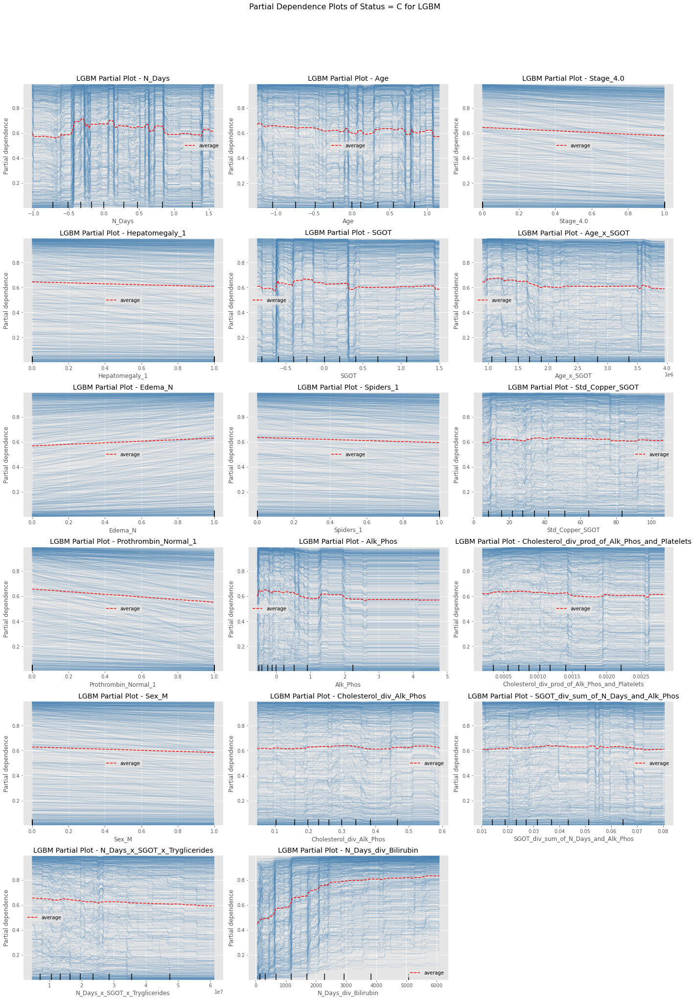

In [40]:
model = lg.fit(X[features], y)

# Number of rows for the subplot grid
num_features = len(features)
num_cols = 3
num_rows = math.ceil(num_features / num_cols)

# Create a larger figure to accommodate the subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
fig.suptitle('Partial Dependence Plots of Status = C for LGBM', fontsize=16)

# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95], pad=4.0, h_pad=4.0, w_pad=2.0)

# Iterate over features and create each plot
for i, feature in enumerate(features):
    ax = axs[i // num_cols, i % num_cols]
    PartialDependenceDisplay.from_estimator(model, 
                                            X[features], 
                                            [feature],
                                            pd_line_kw={'color': 'red'},
                                            ice_lines_kw={'color': 'steelblue'},
                                            kind='both',
                                            target=0,
                                            response_method='predict_proba',
                                            subsample=500,
                                            random_state=5,
                                            ax=ax)
    ax.set_title(f'LGBM Partial Plot - {feature}')

# Hide any unused subplots
for i in range(num_features, num_rows * num_cols):
    axs[i // num_cols, i % num_cols].set_visible(False)

plt.show()

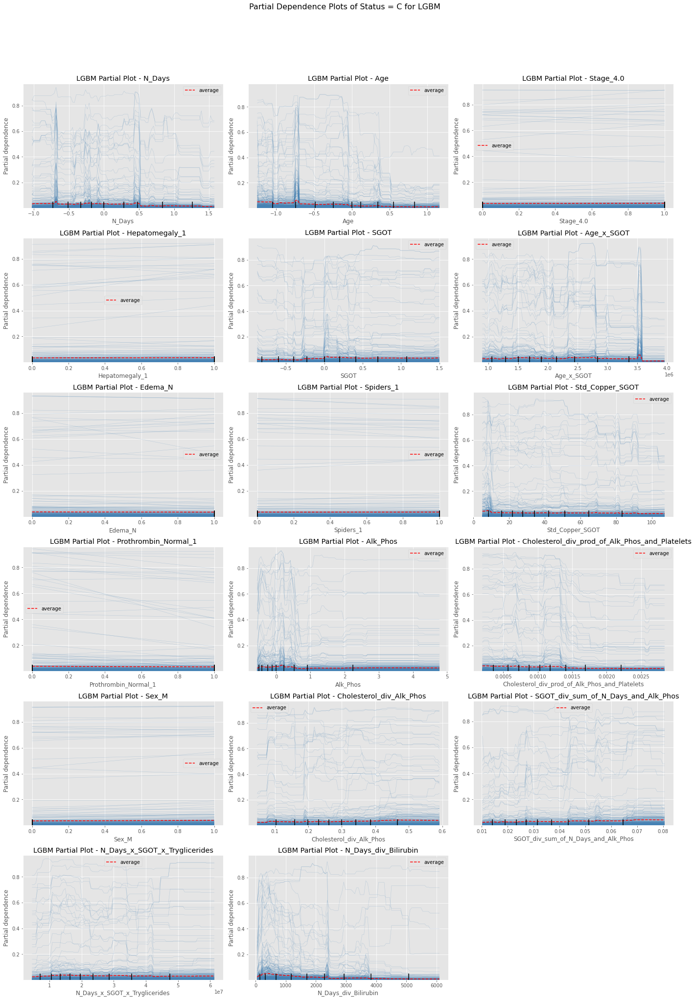

In [41]:
model = lg.fit(X[features], y)

# Number of rows for the subplot grid
num_features = len(features)
num_cols = 3
num_rows = math.ceil(num_features / num_cols)

# Create a larger figure to accommodate the subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
fig.suptitle('Partial Dependence Plots of Status = C for LGBM', fontsize=16)

# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95], pad=4.0, h_pad=4.0, w_pad=2.0)

# Iterate over features and create each plot
for i, feature in enumerate(features):
    ax = axs[i // num_cols, i % num_cols]
    PartialDependenceDisplay.from_estimator(model, 
                                            X[features], 
                                            [feature],
                                            pd_line_kw={'color': 'red'},
                                            ice_lines_kw={'color': 'steelblue'},
                                            kind='both',
                                            target=1,
                                            response_method='predict_proba',
                                            subsample=500,
                                            random_state=5,
                                            ax=ax)
    ax.set_title(f'LGBM Partial Plot - {feature}')

# Hide any unused subplots
for i in range(num_features, num_rows * num_cols):
    axs[i // num_cols, i % num_cols].set_visible(False)

plt.show()

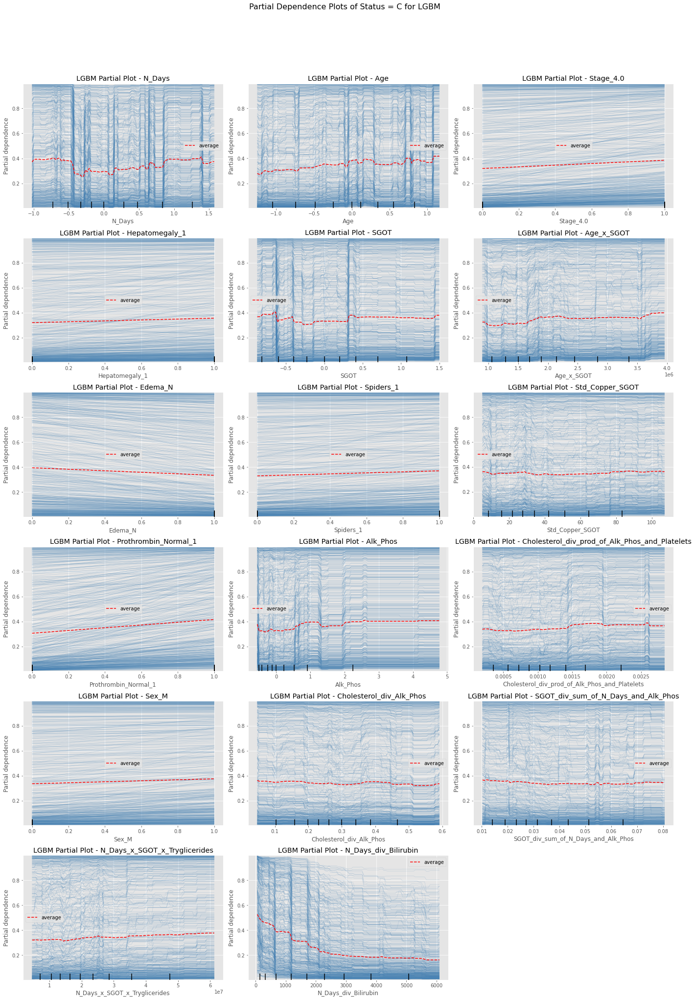

In [43]:
model = lg.fit(X[features], y)

# Number of rows for the subplot grid
num_features = len(features)
num_cols = 3
num_rows = math.ceil(num_features / num_cols)

# Create a larger figure to accommodate the subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
fig.suptitle('Partial Dependence Plots of Status = C for LGBM', fontsize=16)

# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95], pad=4.0, h_pad=4.0, w_pad=2.0)

# Iterate over features and create each plot
for i, feature in enumerate(features):
    ax = axs[i // num_cols, i % num_cols]
    PartialDependenceDisplay.from_estimator(model, 
                                            X[features], 
                                            [feature],
                                            pd_line_kw={'color': 'red'},
                                            ice_lines_kw={'color': 'steelblue'},
                                            kind='both',
                                            target=2,
                                            response_method='predict_proba',
                                            subsample=500,
                                            random_state=5,
                                            ax=ax)
    ax.set_title(f'LGBM Partial Plot - {feature}')

# Hide any unused subplots
for i in range(num_features, num_rows * num_cols):
    axs[i // num_cols, i % num_cols].set_visible(False)

plt.show()

In [45]:
# features = ['N_Days',
#  'Age',
#  'Stage_4.0',
#  'Hepatomegaly_1',
#  'SGOT',
#  'Age_x_SGOT',
#  'Edema_N',
#  'Spiders_1',
#  'Std_Copper_SGOT',
#  'Prothrombin_Normal_1',
#  'Alk_Phos',
#  'Cholesterol_div_prod_of_Alk_Phos_and_Platelets',
#  'Sex_M',
#  'Cholesterol_div_Alk_Phos',
#  'SGOT_div_sum_of_N_Days_and_Alk_Phos',
#  'N_Days_x_SGOT_x_Tryglicerides',
#  'N_Days_div_Bilirubin']

pdp_to_drop = ['Stage_4.0', 'Hepatomegaly_1', 'Edema_N', 'Spiders_1', 'Prothrombin_Normal_1', 'Sex_M']

In [56]:
X_pdp = X[features]
# X_pdp = X_pdp.drop(pdp_to_drop, axis=1)
# X_pdp['SGOT'] = X_pdp['SGOT'].clip(None, 0.75)
# X_pdp['Alk_Phos'] = X_pdp['Alk_Phos'].clip(None, 3)
X_pdp

,N_Days,Age,Stage_4.0,Hepatomegaly_1,SGOT,Age_x_SGOT,Edema_N,Spiders_1,Std_Copper_SGOT,Prothrombin_Normal_1,Alk_Phos,Cholesterol_div_prod_of_Alk_Phos_and_Platelets,Sex_M,Cholesterol_div_Alk_Phos,SGOT_div_sum_of_N_Days_and_Alk_Phos,N_Days_x_SGOT_x_Tryglicerides,N_Days_div_Bilirubin
0,-0.570254,0.554012,0.0,0.0,1.150000,3871453.60,1.0,0.0,5.515433,0.0,0.410557,0.000501,1.0,0.197377,0.069154,11316072.6,434.347826
1,0.509253,0.104892,0.0,0.0,0.425000,2594109.45,1.0,0.0,50.805622,1.0,0.253177,0.000700,0.0,0.252778,0.033595,30545143.2,2860.000000
2,1.094585,-0.973386,1.0,1.0,0.175000,1638317.45,0.0,1.0,8.237794,1.0,-0.148583,0.001460,0.0,0.290573,0.026778,20456590.0,1038.787879
3,0.510624,-0.047162,0.0,0.0,-0.600000,1316198.00,1.0,0.0,9.404520,0.0,0.461388,0.000576,0.0,0.154870,0.016860,17632204.8,4293.333333
4,-0.714873,-0.399804,1.0,1.0,0.275000,2091411.90,1.0,0.0,44.229529,0.0,0.000000,0.000983,0.0,0.292972,0.063763,9497606.4,716.363636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8176,-0.464702,0.713503,0.0,1.0,-0.282258,2033577.00,1.0,0.0,47.376154,0.0,-0.375367,0.001072,0.0,0.308657,0.046667,11856299.0,2882.499999
8177,-0.573681,0.507436,0.0,0.0,-0.620968,1490580.00,1.0,0.0,20.506097,0.0,-0.014663,0.000965,0.0,0.222985,0.032407,5705560.0,2484.999999
8178,-0.611378,0.795695,0.0,0.0,1.008065,3893157.00,1.0,0.0,93.338095,0.0,0.520039,0.001083,0.0,0.253357,0.064480,16056900.0,552.352941
8179,-0.679918,-0.943640,0.0,0.0,0.137097,1623843.00,1.0,0.0,33.941125,0.0,-0.128055,0.000702,0.0,0.235238,0.061938,8638344.0,419.500000


In [57]:
pdp_features = {'LGBMClassifier': ['N_Days',
                    'Age',
                    'Stage_4.0',
                    'Hepatomegaly_1',
                    'SGOT',
                    'Age_x_SGOT',
                    'Edema_N',
                    'Spiders_1',
                    'Std_Copper_SGOT',
                    'Prothrombin_Normal_1',
                    'Alk_Phos',
                    'Cholesterol_div_prod_of_Alk_Phos_and_Platelets',
                    'Sex_M',
                    'Cholesterol_div_Alk_Phos',
                    'SGOT_div_sum_of_N_Days_and_Alk_Phos',
                    'N_Days_x_SGOT_x_Tryglicerides',
                    'N_Days_div_Bilirubin']}

In [58]:
pdp_models = evaluate_models(models, X_pdp, y, pdp_features, sk, f'{experiment_name}_pdp')
pdp_models

Done with LGBMClassifier.


,MLA Name,MLA Parameters,MLA Train Log Loss,MLA Test Log Loss,MLA Time
0,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': None...",0.176256,0.45227,0 min 0.91 sec


### Hyperparameter Tuning

In [59]:
lgbm_features = sfs_features['LGBMClassifier']
lgbm_features

['N_Days',
 'Age',
 'Stage_4.0',
 'Hepatomegaly_1',
 'SGOT',
 'Age_x_SGOT',
 'Edema_N',
 'Spiders_1',
 'Std_Copper_SGOT',
 'Prothrombin_Normal_1',
 'Alk_Phos',
 'Cholesterol_div_prod_of_Alk_Phos_and_Platelets',
 'Sex_M',
 'Cholesterol_div_Alk_Phos',
 'SGOT_div_sum_of_N_Days_and_Alk_Phos',
 'N_Days_x_SGOT_x_Tryglicerides',
 'N_Days_div_Bilirubin']

In [ ]:
def objective(trial):
    lgbm_scores = []
    
    for i, (train_idx, test_idx) in enumerate(sk.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Suggesting hyperparameters for LGBMClassifier
        n_estimators = trial.suggest_int('lgbm_n_estimators', 50, 5000)
        max_depth = trial.suggest_int('lgbm_max_depth', 1, 50)
        learning_rate = trial.suggest_loguniform('lgbm_learning_rate', 0.001, 0.2)
        num_leaves = trial.suggest_int('lgbm_num_leaves', 2, 256)
        reg_alpha = trial.suggest_float('lgbm_reg_alpha', 0.0, 10.0)
        reg_lambda = trial.suggest_float('lgbm_reg_lambda', 0.0, 10.0)
        subsample = trial.suggest_float('lgbm_subsample', 0.1, 1.0)
        colsample_bytree = trial.suggest_float('lgbm_colsample_bytree', 0.1, 1.0)
        
        # Train and evaluate LGBMClassifier with the suggested hyperparameters
        lgbm = LGBMClassifier(
            objective='multiclass',
            num_class=3,
            n_estimators=n_estimators,
            max_depth=max_depth,
            learning_rate=learning_rate,
            num_leaves=num_leaves,
            reg_alpha=reg_alpha,
            reg_lambda=reg_lambda,
            subsample=subsample,
            colsample_bytree=colsample_bytree,
            random_state=5,
            n_jobs=-1
        ).fit(X_train[lgbm_features], y_train)
        
        lgbm_pred = lgbm.predict_proba(X_test[lgbm_features])
        lgbm_score = log_loss(y_test, lgbm_pred)
        lgbm_scores.append(lgbm_score)
        
        # Report intermediate objective value
        trial.report(lgbm_score, i)
        
        # Handle pruning based on the intermediate value
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()
    
    return np.mean(lgbm_scores)

n_trials = 300

# Initialize tqdm progress bar
progress_bar = tqdm(total=n_trials, desc='Optimizing', position=0)

# Callback function to update progress bar
def callback(study, trial):
    progress_bar.update(1)

# Create Optuna study object and optimize with callback
pruner = optuna.pruners.MedianPruner(n_startup_trials=3, n_warmup_steps=3)
study = optuna.create_study(study_name="lgbm_optimization", direction='minimize', pruner=pruner)
study.optimize(objective, n_trials=n_trials, callbacks=[callback])

# Best hyperparameters
print(study.best_params)

# Close the progress bar
progress_bar.close()